In [22]:
ROOT_DIR = "/home/user/Documents/projects/Metaworld"
%env MUJOCO_GL=egl

import sys
sys.path.append(ROOT_DIR)

import os
import functools
import json
from tqdm import tqdm
import importlib

# scientific
import cv2
import numpy as np
import torch
import pytorch_lightning as pl

# gym
# from gym.spaces import Box
import mujoco
import metaworld
from metaworld import MT1

# plotting
from PIL import Image
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d

# project imports
# from metaworld.envs.mujoco.sawyer_xyz.test_scripted_policies import ALL_ENVS, test_cases_latest_nonoise
# import reset_space
import utils.camera_utils_v2 as cu
import keyframes.env_utils as env_utils
import keyframes.env_renderer as env_renderer
import keyframes.mujoco_utils as mujoco_utils
import keyframes.keyframe_utils as keyframe_utils
import keyframes.pl_modules as pl_modules
import utils.predict_utils as keyframe_predict

import utils.slam_utils as slam_utils
import utils.depth_utils as depth_utils
import utils.match_utils as match_utils
import utils.transform_utils as transform_utils
import utils.inference_utils as inference_utils

DEVICE = "cuda"

env: MUJOCO_GL=egl


In [58]:
env_idx_excluded = [1,22,31,41,42]
name2idx = {}
for i, name in enumerate(env_utils.env_names):
    name2idx[name] = i
[env_utils.env_names[i] for i in env_idx_excluded]

['basketball-v2', 'hammer-v2', 'reach-v2', 'stick-push-v2', 'stick-pull-v2']

## Load Pretrained Model

In [2]:
importlib.reload(inference_utils)

<module 'utils.inference_utils' from '/home/user/Documents/projects/Metaworld/utils/inference_utils.py'>

In [50]:
config = inference_utils.load_config("feature_matching", "01")
ckpt_path = "/home/user/Documents/projects/osil/metaworld/vkzro9co/checkpoints/epoch=34-step=3885.ckpt"
model = pl_modules.PLModel(config["model_args"], config["optimizer_args"])
model = model.load_from_checkpoint(ckpt_path)
model.to("cpu")
model.eval();

In [47]:
# prediction using pl trainer
model_data = pl_modules.PLData(
    batch_size=config["training"]["batch_size"],
    num_workers=config["training"]["num_workers"], # TODO make this a param
    **config["dataset_args"],
)
trainer = pl.Trainer(
    accelerator="gpu" if str(DEVICE).startswith("cuda") else "cpu",
    devices=1,
    enable_progress_bar=True,
    # fast_dev_run=True
)
predictions = trainer.predict(
    model,
    model_data,
    # ckpt_path=ckpt_path,
    return_predictions=True
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

In [48]:
len(predictions)

42

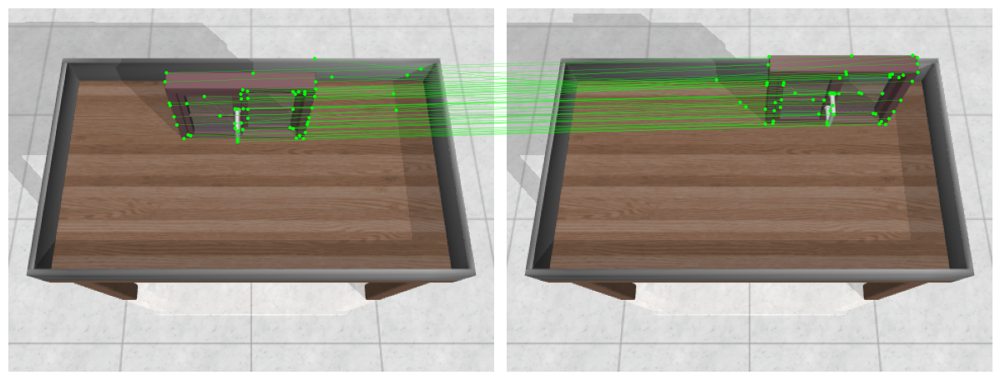

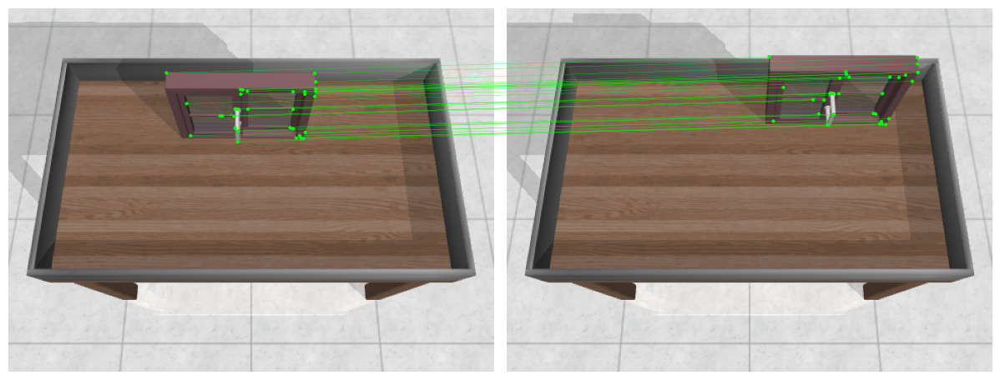

In [53]:
batch_index = 0
pred, batch = predictions[25]
image_1, image_2 = batch[0][batch_index], batch[1][batch_index]
match_data_gt = inference_utils.batch_data_to_match_data(batch, batch_index)
match_data_pred = inference_utils.predictions_to_match_data(match_data_gt, pred, batch_index)
inference_utils.show_matches(image_1, image_2, match_data_pred)
inference_utils.show_matches(image_1, image_2, match_data_gt)

## Inference

In [ ]:
extractor = slam_utils.get_super_glue_extractor(device=device)

keyframe_data_1 = inference_utils.generate_data(extractor, camera_name="frontview", img_res=(300,300))
keyframe_data_2 = inference_utils.generate_data(extractor, env=keyframe_data_1["env"], camera_name="frontview", img_res=(300,300))
image_data_1 = inference_utils.keyframe_data_to_image_data(keyframe_data_1, 0)
image_data_2 = inference_utils.keyframe_data_to_image_data(keyframe_data_2, 0)
match_data_gt = inference_utils.match_images(image_data_1, image_data_2, keyframe_data_1["point_cloud_sensor"])

inference_utils.show_matches(image_data_1.image, image_data_2.image, match_data_gt)

## Predict object movement

In [23]:
importlib.reload(keyframe_utils)
importlib.reload(inference_utils)
importlib.reload(depth_utils)

<module 'utils.depth_utils' from '/home/user/Documents/projects/Metaworld/utils/depth_utils.py'>

In [28]:
def match_lightglue_finetuned(model: pl_modules.PLModel, match_data_gt: match_utils.MatchData):
    pred = model(inference_utils.match_data_to_model_input(match_data_gt))
    match_data_pred = inference_utils.predictions_to_match_data(match_data_gt, pred, 0)
    return match_data_pred

In [64]:
def predict_feature_movement(keyframe_data_0, keyframe_data_1, T_world2pixel, T_pixel2world):

    # image data
    k = 0
    image_data_0_0 = match_utils.keyframe_data_to_image_data(keyframe_data_0, k)
    image_data_0_1 = match_utils.keyframe_data_to_image_data(keyframe_data_0, k+1)
    image_data_1_0 = image_data_0_0
    image_data_1_1 = match_utils.keyframe_data_to_image_data(keyframe_data_1, k)

    # match data
    match_data_0_gt_args = match_utils.match_keyframes(keyframe_data_0, keyframe_data_0, extractor, T_pixel2world, env.model.ngeom, k0=0, k1=1, eps=0.01, max_keypoints=300)
    match_data_1_gt_args = match_utils.match_keyframes(keyframe_data_0, keyframe_data_1, extractor, T_pixel2world, env.model.ngeom, k0=0, k1=0, eps=0.01, max_keypoints=300)
    match_data_0_gt = match_utils.MatchData(**match_data_0_gt_args)
    match_data_1_gt = match_utils.MatchData(**match_data_1_gt_args)
    # match_data_1_gt = inference_utils.match_images(image_data_1_1, image_data_1_2, keyframe_data_1["point_cloud_sensor"])
    # match_data_2_gt = inference_utils.match_images(image_data_2_1, image_data_2_2, keyframe_data_1["point_cloud_sensor"])
    match_data_0 = match_lightglue_finetuned(model, match_data_0_gt)
    # match_data_1 = match_data_1_gt
    match_data_1 = match_lightglue_finetuned(model, match_data_1_gt)

    # world coords for keypoints
    wpos_kpts_0_0 = depth_utils.pixel_coords_to_world_coords_simple(
        T_pixel2world, 
        image_data_0_0.depth,
        match_data_0.keypoints_0.numpy()
    )[:,:3]
    wpos_kpts_0_1 = depth_utils.pixel_coords_to_world_coords_simple(
        T_pixel2world, 
        image_data_0_1.depth,
        match_data_0.keypoints_1.numpy()
    )[:,:3]
    wpos_kpts_1_0 = depth_utils.pixel_coords_to_world_coords_simple(
        T_pixel2world, 
        image_data_1_0.depth,
        match_data_1.keypoints_0.numpy()
    )[:,:3]
    wpos_kpts_1_1 = depth_utils.pixel_coords_to_world_coords_simple(
        T_pixel2world, 
        image_data_1_1.depth,
        match_data_1.keypoints_1.numpy()
    )[:,:3]

    #inference_utils.show_matches(image_data_0_0.img, image_data_0_1.img, match_data_0)
    #inference_utils.show_matches(image_data_1_0.img, image_data_1_1.img, match_data_1)

    # map kpts_0_0 to kpts_1_0
    m_0_0_to_1_0 = -np.ones_like(match_data_0.matches_0)
    for idx_0_0 in range(match_data_0.matches_0.shape[0]):
        wpos_0_0 = wpos_kpts_0_0[idx_0_0]
        dists = np.linalg.norm(wpos_0_0 - wpos_kpts_1_0, axis=1)
        idx_1_0 = np.argmin(dists)
        if dists[idx_1_0] < 0.05:
            m_0_0_to_1_0[idx_0_0] = idx_1_0


    # find moving keypoints in match_data_0
    m_moving_0_0_to_0_1 = []
    for idx_0_0 in range(match_data_0.matches_0.shape[0]):
        idx_0_1 = match_data_0.matches_0[idx_0_0]
        if idx_0_1 != -1:
            wpos_0 = wpos_kpts_0_0[idx_0_0]
            wpos_1 = wpos_kpts_0_1[idx_0_1]
            if np.linalg.norm(wpos_0 - wpos_1) > 0.025:
                m_moving_0_0_to_0_1.append((idx_0_0, idx_0_1))
    m_moving_0_0_to_0_1 = np.array(m_moving_0_0_to_0_1)

    # we assume only 1 object is moving between frames
    # compute center of moving points in 0_1
    wcenter_moving_0_1 = np.mean(wpos_kpts_0_1[m_moving_0_0_to_0_1[:,1]], axis=0)

    # find points in 0_0 close to wcenter_moving_0_1
    closest_points_in_1_0 = keyframe_predict.get_close_feature_points_np(wcenter_moving_0_1, wpos_kpts_1_0, ignore=None, n_closest=10)

    # create map for moving keypoints in 0_1 to 1_1
    m_moving_0_1_to_1_1 = []
    for i in range(m_moving_0_0_to_0_1.shape[0]):
        idx_0_0 = m_moving_0_0_to_0_1[i][0]
        idx_0_1 = m_moving_0_0_to_0_1[i][1]
        idx_1_0 = m_0_0_to_1_0[idx_0_0]
        if idx_1_0 != -1:
            idx_1_1 = match_data_1.matches_0[idx_1_0]
            if idx_1_1 != -1:
                m_moving_0_1_to_1_1.append((idx_0_1, idx_1_1))
    m_moving_0_1_to_1_1 = np.array(m_moving_0_1_to_1_1)

    # create map for closest keypoints in 1_1 to 2_1
    m_closest_1_0_to_1_1 = []
    for i in range(closest_points_in_1_0.shape[0]):
        idx_1_0 = closest_points_in_1_0[i]
        idx_1_1 = match_data_1.matches_0[idx_1_0]
        if idx_1_1 != -1:
            m_closest_1_0_to_1_1.append((idx_1_0, idx_1_1))
    m_closest_1_0_to_1_1 = np.array(m_closest_1_0_to_1_1)

    # compute transformation of closest point matches
    R_closest, t_closest, t_no_rot_closest, predict_closest = keyframe_predict.compute_T(
        wpos_kpts_1_0[m_closest_1_0_to_1_1[:,0]], 
        wpos_kpts_1_1[m_closest_1_0_to_1_1[:,1]]
    )

    # compute new positions of moving points in 2_1
    kpts_2_0 = match_data_1.keypoints_1[m_moving_0_1_to_1_1[:,1]]
    wpos_kpts_2_1 = predict_closest(wpos_kpts_0_1[m_moving_0_1_to_1_1[:,0]])
    kpts_2_1 = depth_utils.world_coords_to_pixel_coords(T_world2pixel, wpos_kpts_2_1)
    # kpts_3_2 = env_utils.world_coords_to_pixel_coords(point_cloud_sensor, wpos_kpts_2_2[m_moving_1_2_to_2_2[:,1]])


    # TODO
    inference_utils.show_matches_kpts(image_data_1_1.img, image_data_1_1.img, kpts_2_0.numpy(), kpts_2_1)

    

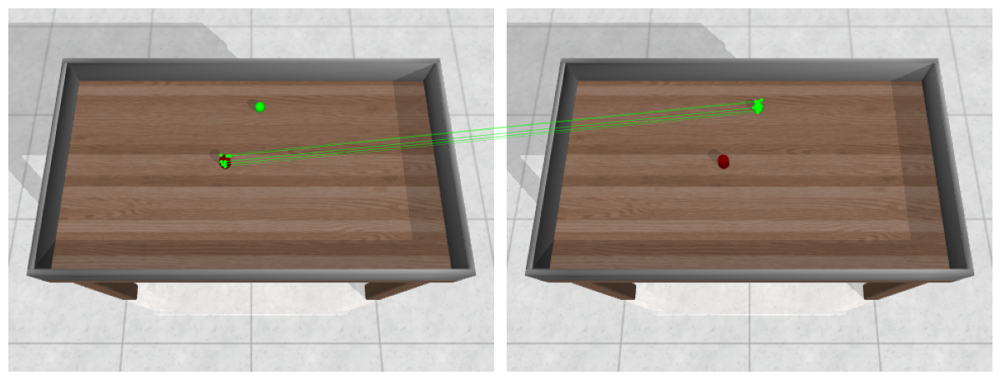

In [65]:
# generate keyframes
env_index = 33
img_height, img_width = 360, 480
env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width)
T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
T_pixel2world = np.linalg.inv(T_world2pixel)
extractor = slam_utils.get_super_glue_extractor()
# TODO 
keyframe_data_0 = keyframe_utils.generate_keyframe_data_with_features(env, renderer, extractor)
keyframe_data_1 = keyframe_utils.generate_keyframe_data_with_features(env, renderer, extractor)
predict_feature_movement(keyframe_data_0, keyframe_data_1, T_world2pixel, T_pixel2world)

0
2
3
4


5
6
7
8
9
10
11
12
13
14
15
16
17
error
18
19
20
21
23


/home/user/anaconda3/envs/kf/lib/python3.9/site-packages/lightglue/viz2d.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(


24
25
26
27
28
29
30
32
33
34
35
36
37
38
39
40
43
44
45
46
47
48
49


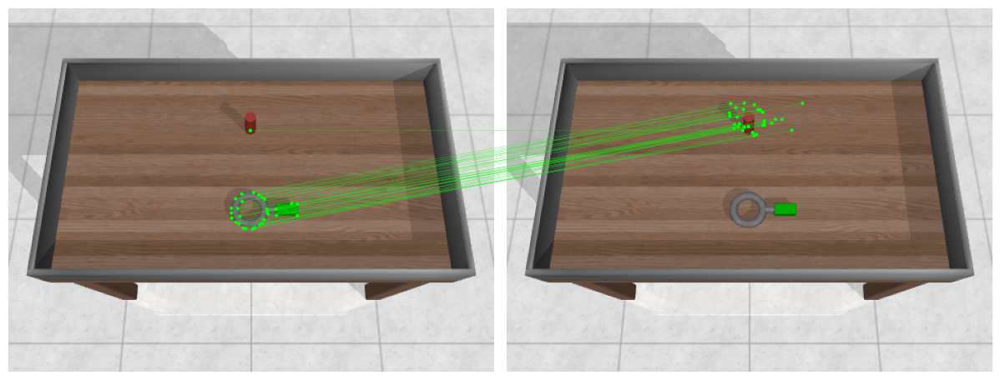

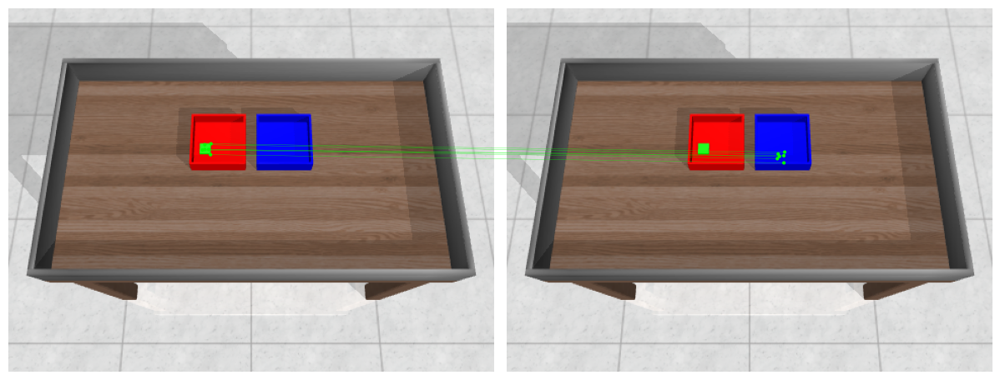

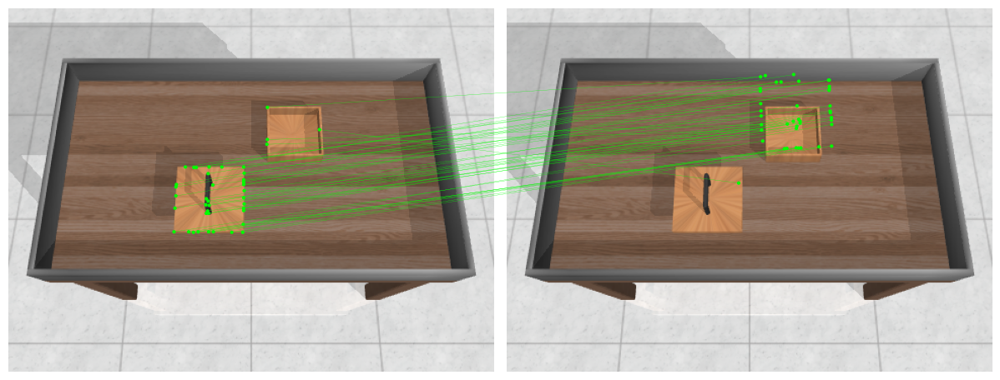

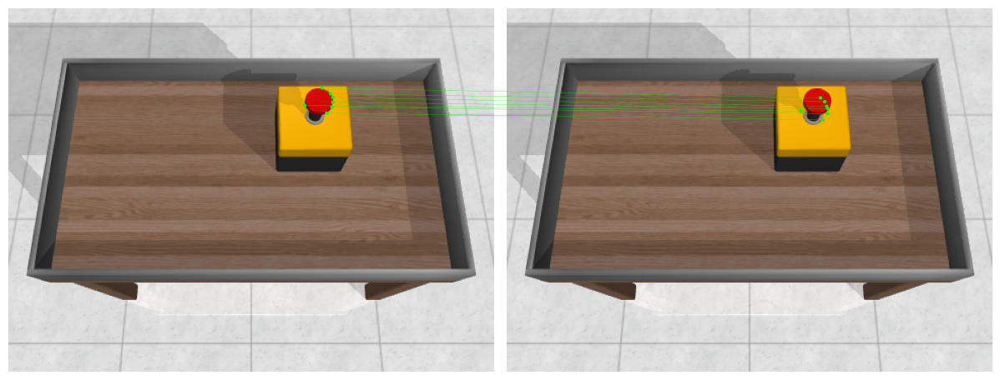

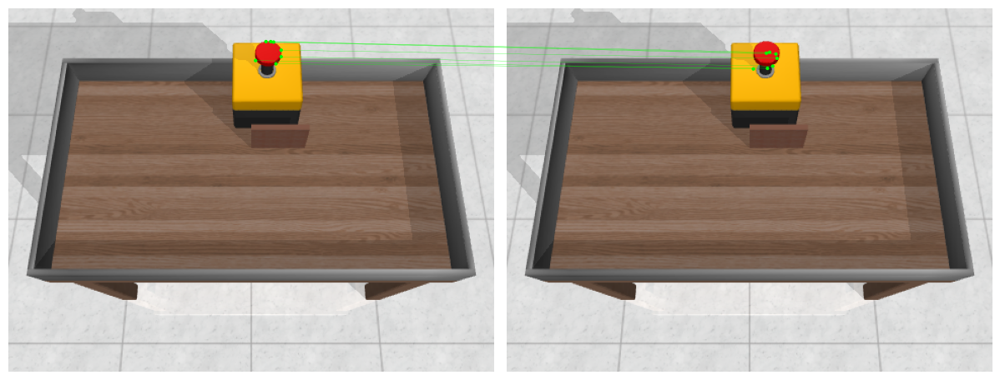

...

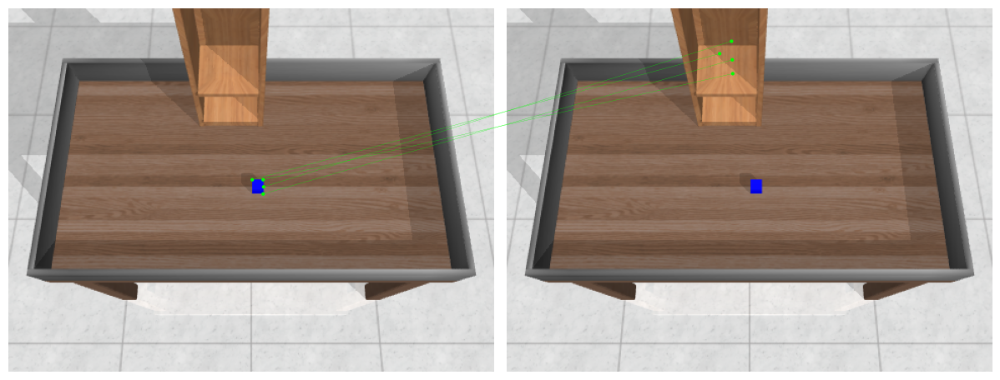

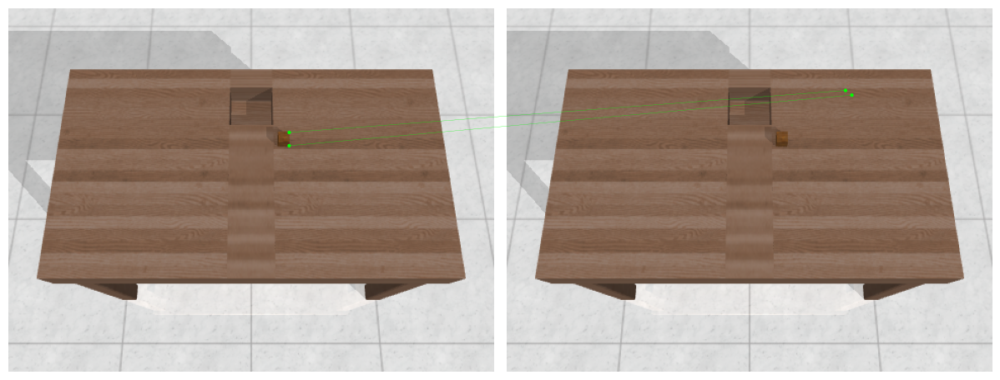

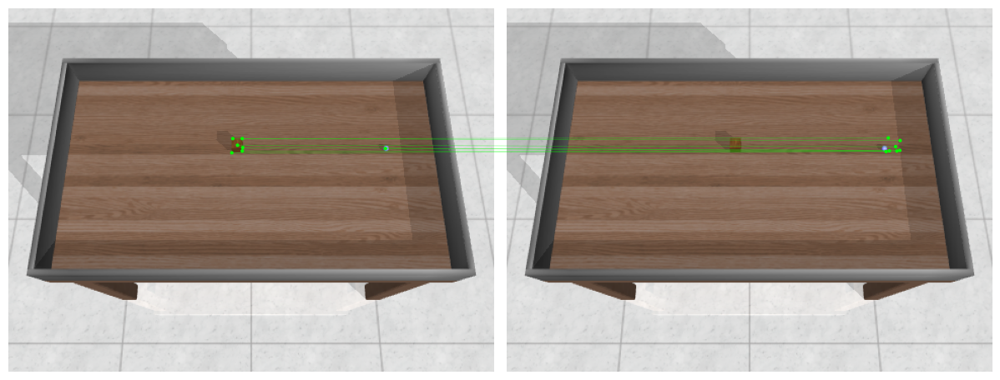

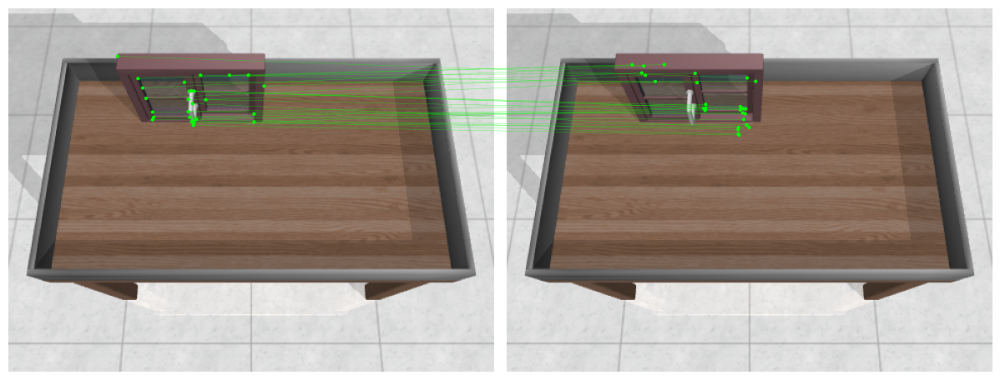

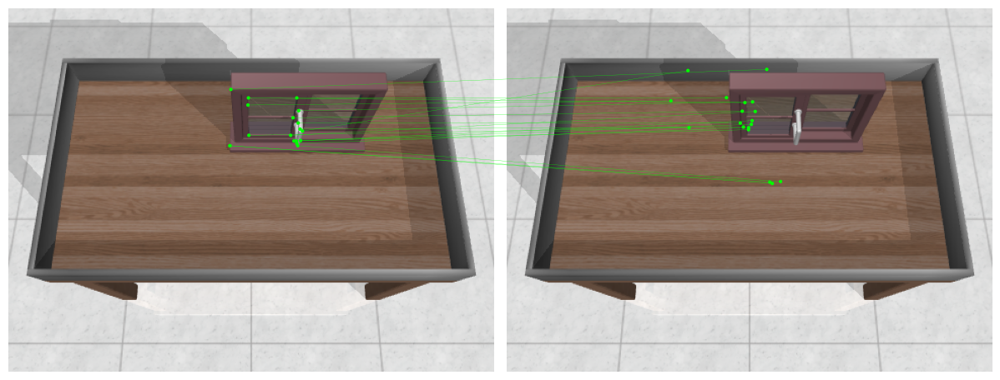

In [66]:
for i in range(50):
    if i in env_idx_excluded:
        continue
    print(i)
    img_height, img_width = 360, 480
    env_index = i
    env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width)
    T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
    T_pixel2world = np.linalg.inv(T_world2pixel)
    extractor = slam_utils.get_super_glue_extractor()
    keyframe_data_0 = keyframe_utils.generate_keyframe_data_with_features(env, renderer, extractor)
    keyframe_data_1 = keyframe_utils.generate_keyframe_data_with_features(env, renderer, extractor)
    try:
        predict_feature_movement(keyframe_data_0, keyframe_data_1, T_world2pixel, T_pixel2world)
    except:
        print("error")

In [46]:
m_moving_0_0_to_0_1

array([], dtype=float64)